<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Importing Required Libraries</b></div> 

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from PIL import Image

from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau

from sklearn.model_selection import train_test_split

2025-07-22 15:10:07.477811: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-22 15:10:07.498419: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1753197007.523543   13999 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1753197007.531528   13999 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1753197007.549925   13999 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step2 : Importing Data And Creating Dataframe</b></div> 

In [2]:
import os
import pandas as pd

# Path to your lung cancer dataset folder
dataset_dir = '/teamspace/studios/this_studio/data/kvasir-dataset-v2'

# Create dataframe
data = []

# Add images path and labels to data
for label, directory in enumerate(os.listdir(dataset_dir)):
    subfolder_path = os.path.join(dataset_dir, directory)
    if os.path.isdir(subfolder_path):  # Check if it is a directory
        for filename in os.listdir(subfolder_path):
            if filename.endswith('.jpg'):  # Ensure it's a .jpg file
                image_path = os.path.join(subfolder_path, filename)
                data.append({'image_path': image_path, 'label': label})

# Convert list to DataFrame
df = pd.DataFrame(data)

# Display the DataFrame
print(df)


                                             image_path  label
0     /teamspace/studios/this_studio/data/kvasir-dat...      0
1     /teamspace/studios/this_studio/data/kvasir-dat...      0
2     /teamspace/studios/this_studio/data/kvasir-dat...      0
3     /teamspace/studios/this_studio/data/kvasir-dat...      0
4     /teamspace/studios/this_studio/data/kvasir-dat...      0
...                                                 ...    ...
7995  /teamspace/studios/this_studio/data/kvasir-dat...      7
7996  /teamspace/studios/this_studio/data/kvasir-dat...      7
7997  /teamspace/studios/this_studio/data/kvasir-dat...      7
7998  /teamspace/studios/this_studio/data/kvasir-dat...      7
7999  /teamspace/studios/this_studio/data/kvasir-dat...      7

[8000 rows x 2 columns]


In [3]:
#Get list of directories in train_dir
labels = os.listdir(dataset_dir)

# Create labels_map dictionary
label_map = {i: label for i, label in enumerate(labels)}
num_classes=len(label_map)
label_map

{0: 'dyed-lifted-polyps',
 1: 'dyed-resection-margins',
 2: 'esophagitis',
 3: 'normal-cecum',
 4: 'normal-pylorus',
 5: 'normal-z-line',
 6: 'polyps',
 7: 'ulcerative-colitis'}

<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step3 : EDA</b></div> 

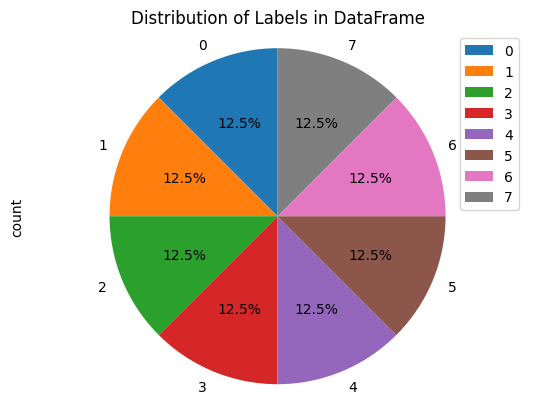

In [4]:
# plot pie chart of train_df
df['label'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Distribution of Labels in DataFrame')
plt.legend(df['label'].unique())
plt.show()  

In [5]:
# Count the number of images in each class
class_counts = df['label'].value_counts().sort_index()

# Print the number of images in each class
print("Dataset Summary")
print("_" * 60)
print(f"{'Class Label':<15} {'Class Name':<30} {'Count':<10}")
print("-" * 60)
for class_label, class_name in label_map.items():
    count = class_counts.get(class_label, 0)  # Safeguard if a class label is missing
    print(f"{class_label:<15} {class_name:<30} {count:<10}")
print("-" * 60)
print(f"{'Total':<45} {class_counts.sum():<10}")

Dataset Summary
____________________________________________________________
Class Label     Class Name                     Count     
------------------------------------------------------------
0               dyed-lifted-polyps             1000      
1               dyed-resection-margins         1000      
2               esophagitis                    1000      
3               normal-cecum                   1000      
4               normal-pylorus                 1000      
5               normal-z-line                  1000      
6               polyps                         1000      
7               ulcerative-colitis             1000      
------------------------------------------------------------
Total                                         8000      


<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step4: Loading and resizing of images</b></div> 

In [6]:
import tensorflow as tf

#Allow gpu usage
gpus = tf.config.experimental.list_physical_devices('GPU')
print(gpus)
try:
    tf.config.experimental.set_memory_growth = True
except Exception as ex:
    print(e)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [7]:
import multiprocessing

max_workers = multiprocessing.cpu_count()
max_workers

8

In [15]:
import concurrent.futures

#define a function to resize image arrays
def resize_image_array(image_path):
    return np.asarray(Image.open(image_path).resize((100,75)))

#Use concurrent futures to parallelize the resizing process
with concurrent.futures.ThreadPoolExecutor(max_workers=max_workers) as executor:
    #Use executor map to ability the function to 
    image_arrays = list(executor.map(resize_image_array, df['image_path'].tolist()))

#Add the resized images arrays to the DataFrame
df['image'] = image_arrays
del image_arrays


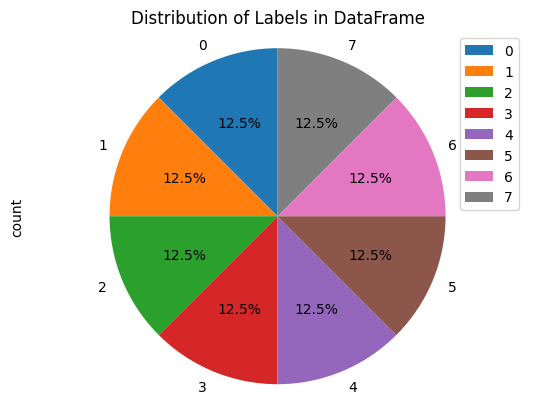

In [9]:
# plot pie chart of train_df
df['label'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Distribution of Labels in DataFrame')
plt.legend(df['label'].unique())
plt.show()

In [16]:
df.head()

,image_path,label,image
0,/teamspace/studios/this_studio/data/kvasir-dat...,0,"[[[3, 4, 3], [4, 4, 3], [4, 4, 4], [4, 4, 4], ..."
1,/teamspace/studios/this_studio/data/kvasir-dat...,0,"[[[4, 4, 4], [4, 4, 3], [4, 4, 3], [4, 4, 4], ..."
2,/teamspace/studios/this_studio/data/kvasir-dat...,0,"[[[3, 3, 2], [2, 2, 2], [3, 3, 2], [2, 2, 2], ..."
3,/teamspace/studios/this_studio/data/kvasir-dat...,0,"[[[4, 5, 5], [5, 5, 4], [5, 5, 4], [4, 5, 4], ..."
4,/teamspace/studios/this_studio/data/kvasir-dat...,0,"[[[4, 4, 3], [4, 4, 4], [4, 4, 3], [4, 4, 3], ..."


<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Displaying the Total Number of images of each class Before Data Augmentation</b></div> 

In [11]:
# Count the number of images in each class
class_counts = df['label'].value_counts().sort_index()

# Print the number of images in each class
print("Dataset Summary")
print("_" * 60)
print(f"{'Class Label':<15} {'Class Name':<30} {'Count':<10}")
print("-" * 60)
for class_label, class_name in label_map.items():
    count = class_counts.get(class_label, 0)  # Safeguard if a class label is missing
    print(f"{class_label:<15} {class_name:<30} {count:<10}")
print("-" * 60)
print(f"{'Total':<45} {class_counts.sum():<10}")

Dataset Summary
____________________________________________________________
Class Label     Class Name                     Count     
------------------------------------------------------------
0               dyed-lifted-polyps             1000      
1               dyed-resection-margins         1000      
2               esophagitis                    1000      
3               normal-cecum                   1000      
4               normal-pylorus                 1000      
5               normal-z-line                  1000      
6               polyps                         1000      
7               ulcerative-colitis             1000      
------------------------------------------------------------
Total                                         8000      


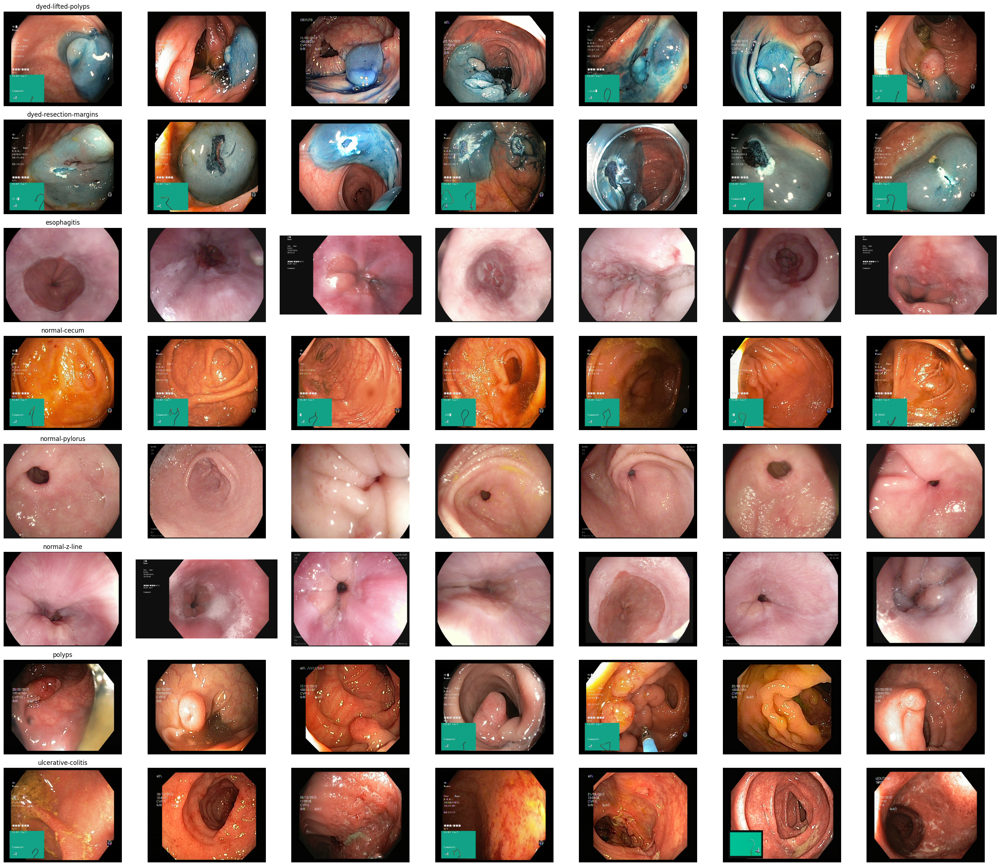

In [12]:
import matplotlib.pyplot as plt
from PIL import Image

n_samples = 7
fig, m_axs = plt.subplots(num_classes, n_samples, figsize=(4 * n_samples, 3 * num_classes))

# Ensure `m_axs` is a 2D array, even if num_classes=1
if num_classes == 1:
    m_axs = [m_axs]

for n_axs, (class_idx, class_rows) in zip(m_axs, df.sort_values(['label']).groupby('label')):
    class_name = label_map[class_idx]  # Get the class name using label_map
    n_axs[0].set_title(class_name)  # Set title for the first subplot in the row
    for c_ax, (_, c_row) in zip(n_axs, class_rows.sample(n_samples, random_state=5).iterrows()):
        # Load and display the image
        img = Image.open(c_row['image_path'])
        c_ax.imshow(img)
        c_ax.axis('off')  # Turn off axes for cleaner display

plt.tight_layout()
plt.show()

In [17]:
df['image'].map(lambda x: x.shape).value_counts()

image
(75, 100, 3)    8000
Name: count, dtype: int64

<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step5: Data Augmentation</b></div> 

In [18]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.densenet import DenseNet201, preprocess_input as densenet_preprocess_input
# ✅ Data Augmentation (With CutMix & MixUp)
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    brightness_range=[0.6, 1.4],  # Slightly wider range
    preprocessing_function=densenet_preprocess_input,
    fill_mode='nearest'
)

In [19]:
# ✅ Define CutMix Function
def cutmix(batch_images, batch_labels, alpha=1.0):
    """Applies CutMix augmentation."""
    batch_size = batch_images.shape[0]
    indices = np.random.permutation(batch_size)  # Ensure integer indices
    lam = np.random.beta(alpha, alpha)

    # Compute CutMix box coordinates
    h, w = batch_images.shape[1:3]
    rx, ry = np.random.randint(0, w), np.random.randint(0, h)
    rw, rh = int(w * np.sqrt(1 - lam)), int(h * np.sqrt(1 - lam))
    
    x1, x2 = np.clip([rx - rw // 2, rx + rw // 2], 0, w)
    y1, y2 = np.clip([ry - rh // 2, ry + rh // 2], 0, h)

    # Apply CutMix
    batch_images[:, y1:y2, x1:x2, :] = batch_images[indices, y1:y2, x1:x2, :]
    batch_labels = lam * batch_labels + (1 - lam) * batch_labels[indices]

    return batch_images, batch_labels

In [20]:
# ✅ Define MixUp Function
def mixup(batch_images, batch_labels, alpha=0.2):
    """Applies MixUp augmentation."""
    batch_size = batch_images.shape[0]
    indices = np.random.permutation(batch_size).astype(int)  # Ensure integer indices
    lam = np.random.beta(alpha, alpha)

    batch_images = lam * batch_images + (1 - lam) * batch_images[indices]
    batch_labels = lam * batch_labels + (1 - lam) * batch_labels[indices]

    return batch_images, batch_labels

<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Display the total number of images of each class after Data Augmentation</b></div> 

In [21]:
# Count the number of images in each class
class_counts = df['label'].value_counts().sort_index()

# Print the number of images in each class
print("Dataset Summary")
print("-" * 60)
print(f"{'Class Label':<15} {'Class Name':<30} {'Count':<10}")
print("-" * 60)
for class_label, class_name in label_map.items():
    # Use indexing to access the count of each class
    count = class_counts.get(class_label, 0)
    print(f"{class_label:<15} {class_name:<30} {count:<10}")
print("-" * 60)
print(f"{'Total':<45} {sum(class_counts):<10}")


Dataset Summary
------------------------------------------------------------
Class Label     Class Name                     Count     
------------------------------------------------------------
0               dyed-lifted-polyps             1000      
1               dyed-resection-margins         1000      
2               esophagitis                    1000      
3               normal-cecum                   1000      
4               normal-pylorus                 1000      
5               normal-z-line                  1000      
6               polyps                         1000      
7               ulcerative-colitis             1000      
------------------------------------------------------------
Total                                         8000      


<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step6: Train and Test split</b></div> 

In [22]:
features = df.drop(columns=['label','image_path'],axis=1)
target = df['label']


In [23]:
features.head()

,image
0,"[[[3, 4, 3], [4, 4, 3], [4, 4, 4], [4, 4, 4], ..."
1,"[[[4, 4, 4], [4, 4, 3], [4, 4, 3], [4, 4, 4], ..."
2,"[[[3, 3, 2], [2, 2, 2], [3, 3, 2], [2, 2, 2], ..."
3,"[[[4, 5, 5], [5, 5, 4], [5, 5, 4], [4, 5, 4], ..."
4,"[[[4, 4, 3], [4, 4, 4], [4, 4, 3], [4, 4, 3], ..."


In [24]:
target.head()

0    0
1    0
2    0
3    0
4    0
Name: label, dtype: int64

In [25]:
print(target.shape,features.shape)

(8000,) (8000, 1)


In [26]:
x_train, x_test, y_train, y_test = train_test_split(features,target, test_size=0.20,shuffle=True)

<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step7: Normalization of Data</b></div> 

In [28]:
x_train = np.asarray(x_train['image'].tolist())
x_test  = np.asarray(x_test['image'].tolist())

x_train_mean = np.mean(x_train)
x_train_std = np.std(x_train)
x_test_mean = np.mean(x_test)
x_test_std = np.std(x_test)

x_train = (x_train - x_train_mean)/x_train_std
x_test = (x_test - x_test_mean)/x_train_std

<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step8: Label Encoding</b></div> 

In [29]:
# Performs one-hot encoding on the labels
y_train = to_categorical(y_train,num_classes = num_classes)
y_test = to_categorical(y_test,num_classes = num_classes)

<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step9: Splitting the data into training and validation split</b></div> 

In [31]:
x_train, x_validate, y_train, y_validate = train_test_split(x_train, y_train, test_size=0.2, shuffle=True)

In [32]:
#Reshape_image in 3 dimensions (height = 75px, width = 100px, canal =3)
x_train = x_train.reshape(x_train.shape[0], *(75, 100, 3))
x_test = x_test.reshape(x_test.shape[0], *(75, 100, 3))
x_validate = x_validate.reshape(x_validate.shape[0], *(75, 100, 3))

In [33]:
y_train = y_train.astype(int)
y_validate = y_validate.astype(int)

In [65]:
print("y_train shape:", y_train.shape)
print("y_validate shape:", y_validate.shape)
print("y_test shape:", y_test.shape)
print("Sample y_train[0]:", y_train[0])

y_train shape: (5120, 8)
y_validate shape: (1280, 8)
y_test shape: (1600, 8)
Sample y_train[0]: [0 0 0 1 0 0 0 0]


<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Display the total number of images of each class</b></div> 

In [36]:
# Calculate the number of images in each class for train, validation and test datasets
train_counts = np.sum(y_train, axis=0)
val_counts = np.sum(y_validate, axis=0)
test_counts = np.sum(y_test, axis=0)

# Print the number of images in each class for train, validation and test datasets
print("Dataset Summary")
print("-" * 90)
print(f"{'Class_Label' :<15} {'Class_Name' :<30} {'Train':<10} {'Validation' :<12} {'Test' :<10} {'Total' :<10}")
print("-" * 90)

for class_label, class_name in label_map.items():
    train_num = int(train_counts[class_label])
    val_num = int(val_counts[class_label])
    test_num = int(test_counts[class_label])
    total_num = train_num + val_num + test_num
    print(f"{class_label:<15} {class_name:<30} {train_num:<10} {val_num:<12} {test_num:<10} {total_num:<10}")

print("-" * 90)
print(f"{'Total' :<45} {len(y_train):<10} {len(y_validate):<12} {len(y_test):<10} {len(y_train) + len(y_validate) + len(y_test):<10}")


Dataset Summary
------------------------------------------------------------------------------------------
Class_Label     Class_Name                     Train      Validation   Test       Total     
------------------------------------------------------------------------------------------
0               dyed-lifted-polyps             641        169          190        1000      
1               dyed-resection-margins         636        175          189        1000      
2               esophagitis                    661        143          196        1000      
3               normal-cecum                   628        151          221        1000      
4               normal-pylorus                 649        160          191        1000      
5               normal-z-line                  662        148          190        1000      
6               polyps                         625        161          214        1000      
7               ulcerative-colitis             618        

In [37]:
df.groupby('label').size()

label
0    1000
1    1000
2    1000
3    1000
4    1000
5    1000
6    1000
7    1000
dtype: int64

In [38]:
input_shape = df['image'][0].shape
print("Input shape of one image:", input_shape)

Input shape of one image: (75, 100, 3)


<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step10: Model Architecture</b></div> 

In [42]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.densenet import DenseNet201, preprocess_input as densenet_preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

In [43]:
# Define Constants
input_shape = (75, 100, 3)  # Adjust based on your dataset
num_classes = 8  # 8 classes in the Kvasir dataset
batch_size = 32
epochs = 20

In [45]:
from keras.applications import DenseNet201
from keras.models import Model
from keras.layers import GlobalAveragePooling2D, Dropout, Dense
from keras.regularizers import l2

# ✅ Load DenseNet201 without top layers
base_model = DenseNet201(include_top=False, weights='imagenet', input_shape=input_shape)

# ✅ Freeze base model layers
base_model.trainable = False

# ✅ Add Custom Fully Connected Layers
x = GlobalAveragePooling2D()(base_model.output)  # Replacing Flatten() to reduce parameters
x = Dropout(0.6)(x)  # Increased dropout
x = Dense(512, activation='relu', kernel_regularizer=l2(0.0001))(x)  # L2 regularization
x = Dropout(0.5)(x)
output_layer = Dense(num_classes, activation='softmax')(x)

# ✅ Create the model
model = Model(inputs=base_model.input, outputs=output_layer)

# ✅ Summary
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 75, 100,   │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_4    │ (None, 81, 106,   │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 38, 50,    │      9,408 │ zero_padding2d_4… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 38, 50,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 38, 50,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_5    │ (None, 40, 52,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 19, 25,    │          0 │ zero_padding2d_5… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 19, 25,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 19, 25,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 19, 25,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 19, 25,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 19, 25,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 19, 25,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 19, 25,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 19, 25,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 19, 25,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 19, 25,    │     12,288 │ conv2_block2_0_r

 Total params: 19,309,640 (73.66 MB)

 Trainable params: 987,656 (3.77 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step11: Setting Optimizer</b></div> 

In [46]:
# Compile Model with AdamW Optimizer
opt = AdamW(learning_rate=0.001, weight_decay=1e-4)  # AdamW handles weight decay better
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Learning Rate Scheduler (Cosine Decay)
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(
    lambda epoch: 0.001 * (0.5 ** (epoch // 3))  # Reduce LR every 3 epochs
)

# Early Stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True)


<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step12: Fitting of model</b></div> 

In [47]:
# Train the Model
history = model.fit(
    x_train,
    y_train,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_validate, y_validate),
    callbacks=[lr_scheduler, early_stopping]
)

Epoch 1/20


I0000 00:00:1753198067.892315   14781 service.cc:152] XLA service 0x739508001970 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1753198067.892836   14781 service.cc:160]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2025-07-22 15:27:48.721137: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1753198073.655221   14781 cuda_dnn.cc:529] Loaded cuDNN version 90701


  4/160 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.1465 - loss: 6.8236    

I0000 00:00:1753198098.773618   14781 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.4664 - loss: 2.7087

2025-07-22 15:28:31.955356: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5433_0', 32 bytes spill stores, 32 bytes spill loads

2025-07-22 15:28:32.198466: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5433', 504 bytes spill stores, 504 bytes spill loads

2025-07-22 15:28:32.545033: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5433', 40 bytes spill stores, 40 bytes spill loads

2025-07-22 15:28:32.970575: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_5440', 4 bytes spill stores, 4 bytes spill loads

2025-07-22 15:28:33.267817: I external

160/160 ━━━━━━━━━━━━━━━━━━━━ 82s 209ms/step - accuracy: 0.4670 - loss: 2.7027 - val_accuracy: 0.7641 - val_loss: 0.6753 - learning_rate: 0.0010
Epoch 2/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.6640 - loss: 0.9387 - val_accuracy: 0.7703 - val_loss: 0.6031 - learning_rate: 0.0010
Epoch 3/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - accuracy: 0.7115 - loss: 0.8256 - val_accuracy: 0.7937 - val_loss: 0.5460 - learning_rate: 0.0010
Epoch 4/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.7426 - loss: 0.7039 - val_accuracy: 0.8070 - val_loss: 0.5427 - learning_rate: 5.0000e-04
Epoch 5/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - accuracy: 0.7641 - loss: 0.6560 - val_accuracy: 0.8008 - val_loss: 0.5248 - learning_rate: 5.0000e-04
Epoch 6/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.7437 - loss: 0.6631 - val_accuracy: 0.8180 - val_loss: 0.5125 - learning_rate: 5.0000e-04
Epoch 7/20
160/160 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - accuracy: 0.7621 - loss:

In [48]:
# ✅ Unfreeze Base Model for Fine-Tuning
base_model.trainable = True  # Fine-tune after initial training
opt_fine_tune = AdamW(learning_rate=1e-5)  # Lower LR for fine-tuning
model.compile(optimizer=opt_fine_tune, loss='categorical_crossentropy', metrics=['accuracy'])

# ✅ Continue Training with Unfrozen Model
history_finetune = model.fit(
    x_train,
    y_train,
    epochs=10,  # Additional fine-tuning
    batch_size=batch_size,
    validation_data=(x_validate, y_validate),
    callbacks=[early_stopping]
)

Epoch 1/10


2025-07-22 15:37:04.342242: E external/local_xla/xla/service/slow_operation_alarm.cc:73] 
********************************
[Compiling module a_inference_one_step_on_data_253362__.69390] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************
2025-07-22 15:37:27.246891: E external/local_xla/xla/service/slow_operation_alarm.cc:140] The operation took 2m22.904833198s

********************************
[Compiling module a_inference_one_step_on_data_253362__.69390] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************


160/160 ━━━━━━━━━━━━━━━━━━━━ 403s 228ms/step - accuracy: 0.5143 - loss: 1.3640 - val_accuracy: 0.8023 - val_loss: 0.6073
Epoch 2/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.7069 - loss: 0.7733 - val_accuracy: 0.8117 - val_loss: 0.5455
Epoch 3/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.7723 - loss: 0.6341 - val_accuracy: 0.8445 - val_loss: 0.4778
Epoch 4/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.8173 - loss: 0.4974 - val_accuracy: 0.8492 - val_loss: 0.4355
Epoch 5/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8297 - loss: 0.4587 - val_accuracy: 0.8617 - val_loss: 0.4032
Epoch 6/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.8627 - loss: 0.4032 - val_accuracy: 0.8680 - val_loss: 0.3811
Epoch 7/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.8847 - loss: 0.3568 - val_accuracy: 0.8719 - val_loss: 0.3678
Epoch 8/10
160/160 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.8823 - loss: 0.3402 - val_accur

In [49]:
loss, accuracy = model.evaluate(x_train, y_train, verbose=1)
print("Train: accuracy = %f  :  loss = %f" % (accuracy, loss))

160/160 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.9677 - loss: 0.1627
Train: accuracy = 0.967773  :  loss = 0.161661


In [50]:
loss, accuracy = model.evaluate(x_test, y_test, verbose=1)
print("Testing: accuracy = %f  :  loss  = %f" %(accuracy,loss))

50/50 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - accuracy: 0.8852 - loss: 0.3411
Testing: accuracy = 0.878125  :  loss  = 0.343072


50/50 ━━━━━━━━━━━━━━━━━━━━ 26s 19ms/step


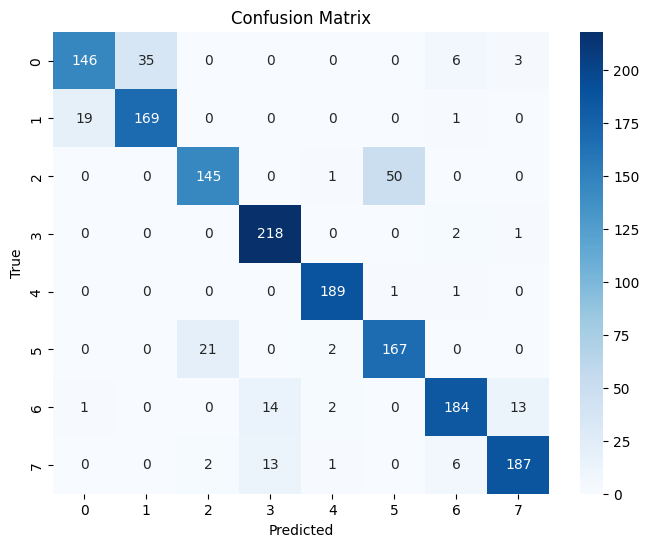

In [51]:
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get the predicted probabilities for the test set
y_pred_prob = model.predict(x_test)

# Find the class with the highest probability for each sample
y_pred = np.argmax(y_pred_prob, axis=1)

# Calculate the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=1), y_pred)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))  # Optional: Adjust figure size
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

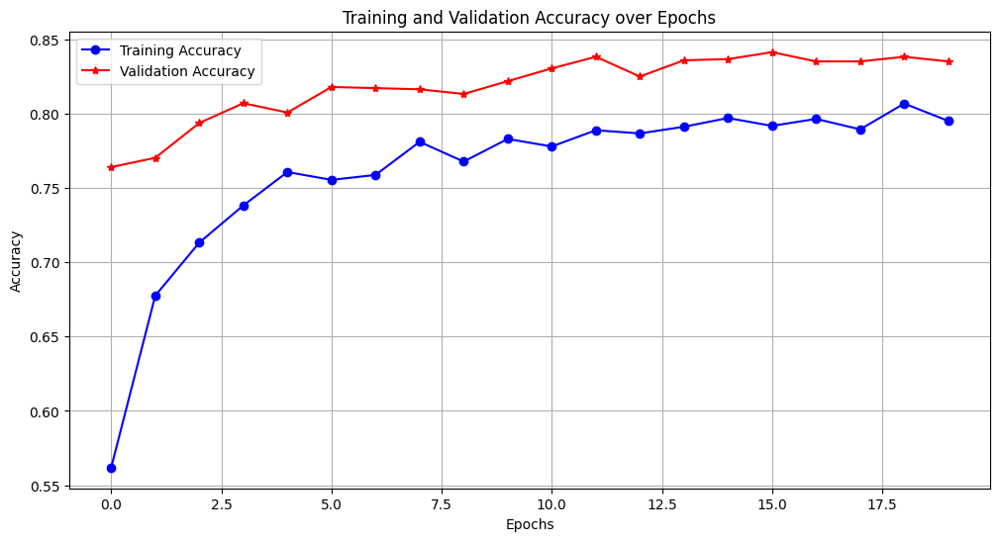

In [63]:
import matplotlib.pyplot as plt

# Extract the metrics
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

# Plot Training and Validation Accuracy
plt.figure(figsize=(12, 6))
plt.plot(training_accuracy, 'bo-', label='Training Accuracy')  # Blue line with circle markers
plt.plot(validation_accuracy, 'r*-', label='Validation Accuracy')  # Red line with star markers
plt.title('Training and Validation Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

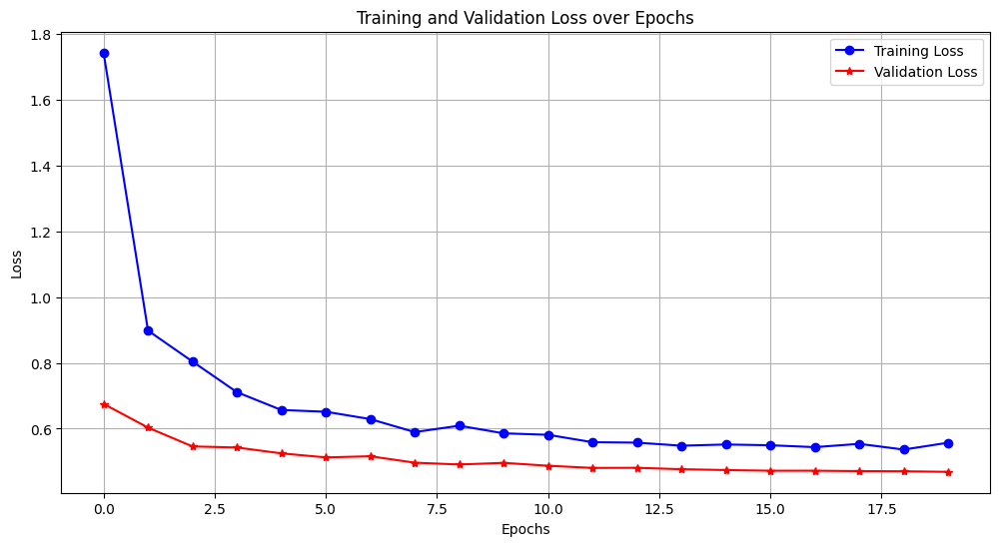

In [64]:
import matplotlib.pyplot as plt

# Extract the metrics
training_loss = history.history['loss']
validation_loss = history.history['val_loss']

# Plot Training and Validation Loss
plt.figure(figsize=(12, 6))
plt.plot(training_loss, 'bo-', label='Training Loss')  # Blue line with circle markers
plt.plot(validation_loss, 'r*-', label='Validation Loss')  # Red line with star markers
plt.title('Training and Validation Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [70]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score

# Calculate evaluation metrics
accuracy = accuracy_score(np.argmax(y_test, axis=1), y_pred)
precision = precision_score(np.argmax(y_test, axis=1), y_pred, average='macro')
recall = recall_score(np.argmax(y_test, axis=1), y_pred, average='macro')
f1 = f1_score(np.argmax(y_test, axis=1), y_pred, average='macro')
kappa = cohen_kappa_score(np.argmax(y_test, axis=1), y_pred)

# Print correct values
print(f"Accuracy     : {accuracy: .4f}")
print(f"Precision    : {precision: .4f}")
print(f"Recall       : {recall: .4f}")
print(f"F1-score     : {f1: .4f}")
print(f"Kappa Score  : {kappa: .4f}")


Accuracy     :  0.8781
Precision    :  0.8791
Recall       :  0.8765
F1-score     :  0.8756
Kappa Score  :  0.8606


<a id="import"></a>
# <div style="padding:20px;color:black;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:white;overflow:hidden"><b>Step13: Model Evaluation</b></div> 

In [55]:
model.save("densenet.h5")

In [ ]:
# If you want to test just a single image
test_image_path = "data/kvasir-dataset-v2/dyed-lifted-polyps/008aa3ed-1812-4854-954c-120ae85bb6bd.jpg"

# Ensure it's an image
if not test_image_path.lower().endswith(('.png', '.jpg', '.jpeg')):
    raise ValueError("Not a valid image")

# Load and preprocess
image = load_img(test_image_path, target_size=(75, 100))
image_array = img_to_array(image) / 255.0
image_array = np.expand_dims(image_array, axis=0)

# Predict
predictions = model.predict(image_array)
predicted_class = np.argmax(predictions[0])
confidence = np.max(predictions[0]) * 100

# Plot
plt.imshow(load_img(test_image_path))
plt.axis('off')
plt.title(f"Predicted: {class_labels[predicted_class]}\nConfidence: {confidence:.2f}%")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
